## Single-cell epigenomics reveals mechanisms of human cortical development

Done by Vladislav Vlasov, r0822900

## Introduction into biological system

Historically, we have been classifying based on the various metrics ranging from morphological to physiological. In recent years, the advances in the single-cell sequencing allows us to start cell profiling based on the gene expression patterns that arise in different cell populations within brain. This allows us to expend our understanding of the underlying mechanisms that are responsible for the developmental processes, tumor formation, and regulatory machinery.

In this project, we are investigating genomic loci that undergo cel-type and brain-region-specific changes in accessibility during formation of neurons. For that, we are analyzing 5 samples of single-cell assays for transposase-accessible chromatin using sequencing. These samples are organoids formed from three different iPSC cell lines. Namely, 13234, H28126, H1. All of them very obtained on the 9th week of developing. Additionally, sample from 13234 cell line was taking on 17th week of development, and H28126 sample on the 24th week. This allows to study for changes in chromatin accessibility on different stages of development.

We are following this [paper](https://www.nature.com/articles/s41586-021-03209-8) published in Nature, which primary focus is the epigenetic aspect of the developmental processes within human cortex. The single-cell RNA sequencing data was used as a supplementary to the scATAC-seq data, which we will analyze in the second project.

Raw data is available on the [NeMO archive](https://assets.nemoarchive.org/dat-gnot1gb) but we will skip the part where researchers were generating count matrices using 10X's Cell Ranger, and start with the already preprocessed outputs in form of count matrices. They are available at [NCBI GEO](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE163018).

## Preparation

In this step I set up my working directory, downloading necessary files, unpacking them, and loading necessary modules.

In [1]:
options(warn = -1)
set.seed(10)

In [2]:
system("wget https://ftp.ncbi.nlm.nih.gov/geo/series/GSE163nnn/GSE163018/suppl/GSE163018_RAW.tar")

In [3]:
system("tar -xf GSE163018_RAW.tar")

In [4]:
list.files()

[1] "GSE163018_RAW.tar"                                               
 [2] "GSM4970295_organoid_13234_9week.snap.gz"                         
 [3] "GSM4970295_organoid_13234_9week_metadata.csv.gz"                 
 [4] "GSM4970295_organoid_scATAC_allsamples_batchcorrected_snap.rds.gz"
 [5] "GSM4970296_organoid_H28126_9week.snap.gz"                        
 [6] "GSM4970296_organoid_H28126_9week_metadata.csv.gz"                
 [7] "GSM4970297_organoid_H1_9week.snap.gz"                            
 [8] "GSM4970297_organoid_H1_9week_metadata.csv.gz"                    
 [9] "GSM4970298_organoid_H28126_scRNA_barcodes.tsv.gz"                
[10] "GSM4970298_organoid_H28126_scRNA_features.tsv.gz"                
[11] "GSM4970298_organoid_H28126_scRNA_matrix.mtx.gz"                  
[12] "GSM4970299_organoid_H1_scRNA_barcodes.tsv.gz"                    
[13] "GSM4970299_organoid_H1_scRNA_features.tsv.gz"                    
[14] "GSM4970299_organoid_H1_scRNA_matrix.mtx.gz"                      
[15] "GSM4970300_organoid_13234_17week.snap.gz"                        
[16] "GSM4970300_organoid_13234_17week_metadata.csv.gz"                
[17] "GSM4970301_organoid_H28126_24week.snap.gz"                       
[18] "GSM4970301_organoid_H28126_24week_metadata.csv.gz"               
[19] "GSM4970302_org_VitACtrlDEAB_well1_barcodes.tsv.gz"               
[20] "GSM4970302_org_VitACtrlDEAB_well1_features.tsv.gz"               
[21] "GSM4970302_org_VitACtrlDEAB_well1_matrix.mtx.gz"                 
[22] "GSM4970302_organoid_VitACtrlDEAB_SeuratObject.rds.gz"            
[23] "GSM4970303_org_VitACtrlDEAB_well2_barcodes.tsv.gz"               
[24] "GSM4970303_org_VitACtrlDEAB_well2_features.tsv.gz"               
[25] "GSM4970303_org_VitACtrlDEAB_well2_matrix.mtx.gz"                 
[26] "GSM4970304_org_VitACtrlDEAB_well3_barcodes.tsv.gz"               
[27] "GSM4970304_org_VitACtrlDEAB_well3_features.tsv.gz"               
[28] "GSM4970304_org_VitACtrlDEAB_well3_matrix.mtx.gz"                 
[29] "scATAC-seq.ipynb"                                                
[30] "scRNA-seq_annotated-4.ipynb"                                     
[31] "seurat_obj_annotated.rds"

In [5]:
# Analysis
library(SnapATAC)
library(GenomicRanges)
library(leiden)
# library(Seurat)
# library(SingleCellExperiment)
# library(scAlign)
library(GenomeInfoDb)
library(EnsDb.Hsapiens.v86)
library(BSgenome.Hsapiens.UCSC.hg38)
library(chromVAR)
library(motifmatchr)
library(SummarizedExperiment)

# Utilities
library(data.table)
library(stringr)
# library(tensorflow)
library(parallel)
library(BiocParallel)
# To solve issue when running runChromVAR. From https://www.biostars.org/p/357154/
register(DoparParam())
registered()
bpparam("SerialParam")

# Visualizations
library(ggplot2)
library(gridExtra)

Loading required package: BSgenome

Loading required package: Biostrings

Loading required package: XVector


Attaching package: 'Biostrings'


The following object is masked from 'package:base':

    strsplit


Loading required package: rtracklayer

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: 'matrixStats'


The following objects are masked from 'package:Biobase':

    anyMissing, rowMedians



Attaching package: 'MatrixGenerics'


The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWe

## Pipeline

As the main tool for the processing and analyzing scATAC-seq data we are going to follow the steps of the reference paper and use [SnapATAC pipeline](https://github.com/r3fang/SnapATAC). Particularly, on the package GitHub we can find the [vignette](https://github.com/r3fang/SnapATAC/tree/master/examples/10X_PBMC_15K#barcode_selection) for processing multiple datasets together.

### Data Import

#### Snap Files

Raw fastq files were first processed with 10X Cell Ranger and aligned to Human genome GRCh38. Files generated by Cell Ranger were than inputted into SnapATAC pipeline followed by generation of Snap files. In this project we are going to deal with Snap files. First, we unzip them and create `Snap objects`.

In [6]:
files_snap <- system("ls *.snap.gz", intern = T)

In [7]:
lapply(files_snap, function(x) {system(paste("gunzip - k", x, sep = " "))}) # Unpacking

In [8]:
files_snap <- gsub("\\.gz*", "", snap.files)
names <- sapply(strsplit(files_snap, '\\.'), '[', 1)

In [9]:
datasets <- lapply(seq(files_snap), function(x) {
        createSnap(file = files_snap[x], sample = names[x])
    }
)

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...

Epoch: reading the barcode session ...



In [10]:
names(datasets) <- names

#### Barcodes

We will also use barcodes for the quality control and filtering.

In [11]:
files_barcodes <- system("ls *.csv.gz", intern = T)
files_barcodes <- gsub("\\.gz*", "", files_barcodes)
lapply(files_barcodes, function(x) {system(paste("gunzip - k", x, sep = ".gz "))}) # Unpacking

### Barcode Selection

We are going to select high-quality barcodes based on the number of unique fragments and fragments in promoter ratio. For the first criteria we are using cells whose logarithmic value of reads passed filters between 3 and 5. For the second, the fraction of reads in promoters should be between 10 and 60%.

In [12]:
select_barcodes <- function(x) {
    barcodes <- fread(files_barcodes[x], header = TRUE)
    barcodes <- barcodes[2:nrow(barcodes), ]
    barcodes$logUMI <- log10(barcodes$passed_filters + 1)
    barcodes$promoter_ratio <- (barcodes$promoter_region_fragments + 1) / (barcodes$passed_filters + 1)
    
    return (barcodes)
}

In [13]:
barcodes_sel <- lapply(seq(datasets), select_barcodes)

In [14]:
get_plots <- function(x) {
    plot <- ggplot(barcodes_sel[[x]], aes(x = logUMI, y = promoter_ratio)) +
            geom_point(size = 0.3) + ggtitle(word(gsub("_", " ", names[[x]]), -2, -1)) + 
            ylim(0, 1) + xlim(0, 6) + labs(x = "log10(UMI)", y = "Promoter Ratio") + theme_classic()
    
    return (plot)
}

In [15]:
plots <- lapply(seq(datasets), get_plots)

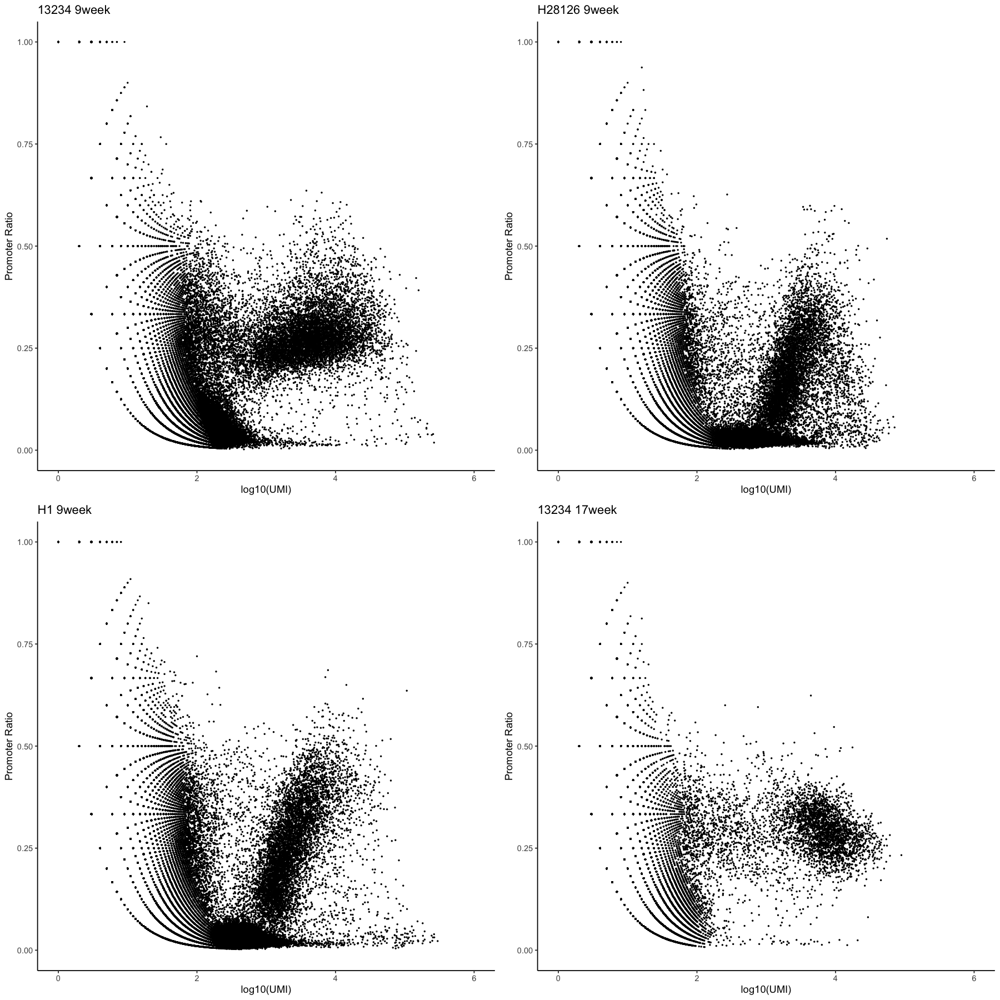

In [16]:
options(repr.plot.width = 15, repr.plot.height = 15)
grid.arrange(plots[[1]], plots[[2]], plots[[3]], plots[[4]], ncol = 2, nrow = 2)

Above we can see visualization of relationship between log10(UMI) and promoter ration of datasets prior filtering.

In [17]:
barcodes_sel <- lapply(barcodes_sel, function(x) { 
    x[which(logUMI > 3 & logUMI < 5 & promoter_ratio > 0.125 & promoter_ratio < 0.5), ]})

In [18]:
add_metadata <- function(x) {
    barcodes <- barcodes_sel[[x]]
    dataset <- datasets[[x]]
    barcode.shared <- intersect(dataset@barcode, barcodes$barcode)
    dataset <- dataset[match(barcode.shared, dataset@barcode),]
    barcodes <- barcodes[match(barcode.shared, barcodes$barcode), ]
    dataset@metaData <- barcodes
    
    return (dataset)
}

In [19]:
datasets <- lapply(seq(datasets), add_metadata)

Below we are integrating datasets to single `Snap object`. We had issue with the library as it was using deprecated function `Matrix::rBind()`. Changing source code of the `Reduce` to use correct function of package `Matrix` and recompiling packages solved this problem

In [20]:
data <- Reduce(snapRbind, datasets)

In [21]:
data@metaData$sample <- data@sample

### Matrix Binarization

Now, we are going to convert cell-by-bin count matrix to a binary matrix.

In [22]:
data <- addBmatToSnap(data, bin.size = 5000)
data <- makeBinary(data, mat = "bmat")

Epoch: reading cell-bin count matrix session ...



After adding bins to the `Snap object`, we are going to filter these bins using [ENCODE blacklist](https://github.com/Boyle-Lab/Blacklist), which defines regions in the genomes that have anomalous, unstructured, or high signal in NGS datasets.

In [23]:
black_list <- read.table("./hg38-blacklist.v2.bed", fill = TRUE , header = FALSE)

In [24]:
black_list <- GRanges(black_list[, 1], IRanges(black_list[, 2], black_list[, 3]))
idy <- queryHits(findOverlaps(data@feature, black_list))
data <- data[, -idy, mat = "bmat"]

In the cells below we are also filtering for unwanted chromosomes and applying logarithmic transformation so that our data would follow normal distribution. Additionally, we will remove top 5% of bins that overlap with invariant features (house keeping gene promoters).

In [25]:
chr_exclude <- seqlevels(data@feature)[grep("random|chrM", seqlevels(data@feature))]
idy <- grep(paste(chr_exclude, collapse = "|"), data@feature)
data <- data[, -idy, mat = "bmat"]

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



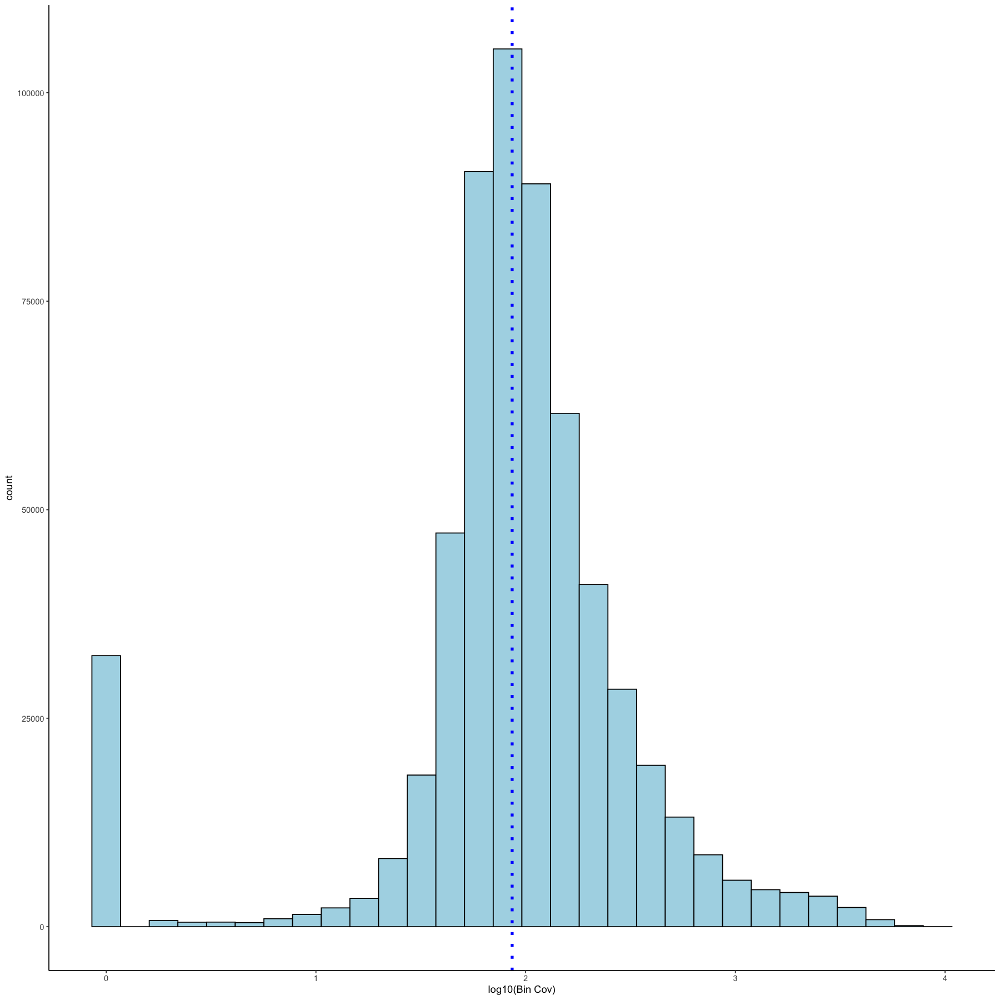

In [26]:
bin_cov <- log10(Matrix::colSums(data@bmat) + 1)

ggplot(as.data.frame(bin_cov), aes(x = bin_cov)) + 
    geom_histogram(color = "black", fill = "lightblue", linetype = "solid") + 
    geom_vline(xintercept = mean(bin_cov), linetype = "dotted", color = "blue", size = 1.5) +
    labs(x = "log10(Bin Cov)") + theme_classic()

As we can see, the distribution looks like a normal distribution with some artifact at the left tail.

In [27]:
bin.cutoff <- quantile(bin_cov[bin_cov > 0], 0.95)
idy <- which(bin_cov <= bin_cov & bin_cov > 0)
data <- data[, idy, mat = "bmat"]

In this step, cells with coverage of <500 bins are removed.

In [28]:
idx <- which(Matrix::rowSums(data@bmat) > 500)
data <- data[idx, ]

### Latent Semantic Analysis

We are going to apply `runLSA` function to generate a cell-by-cell similarity matrix by calculating the latent semantic index of the binarized matrix. That is followed by the SVD procedure on the TF-IDF matrix.

In [29]:
data <- runLSA(obj = data, input.mat = "bmat", pc.num = 50, logTF = TRUE)

Epoch: checking the inputs ...

Epoch: filtering low-coverage matrix ...

Epoch: running term frequency ...

Epoch: running log term frequency ...

Epoch: running inverse document frequency ...

Epoch: running TF-IDF ...

Epoch: running dimensionality reduction ...

Epoch: Done



In [30]:
saveRDS(data, file = "./atac.rds")

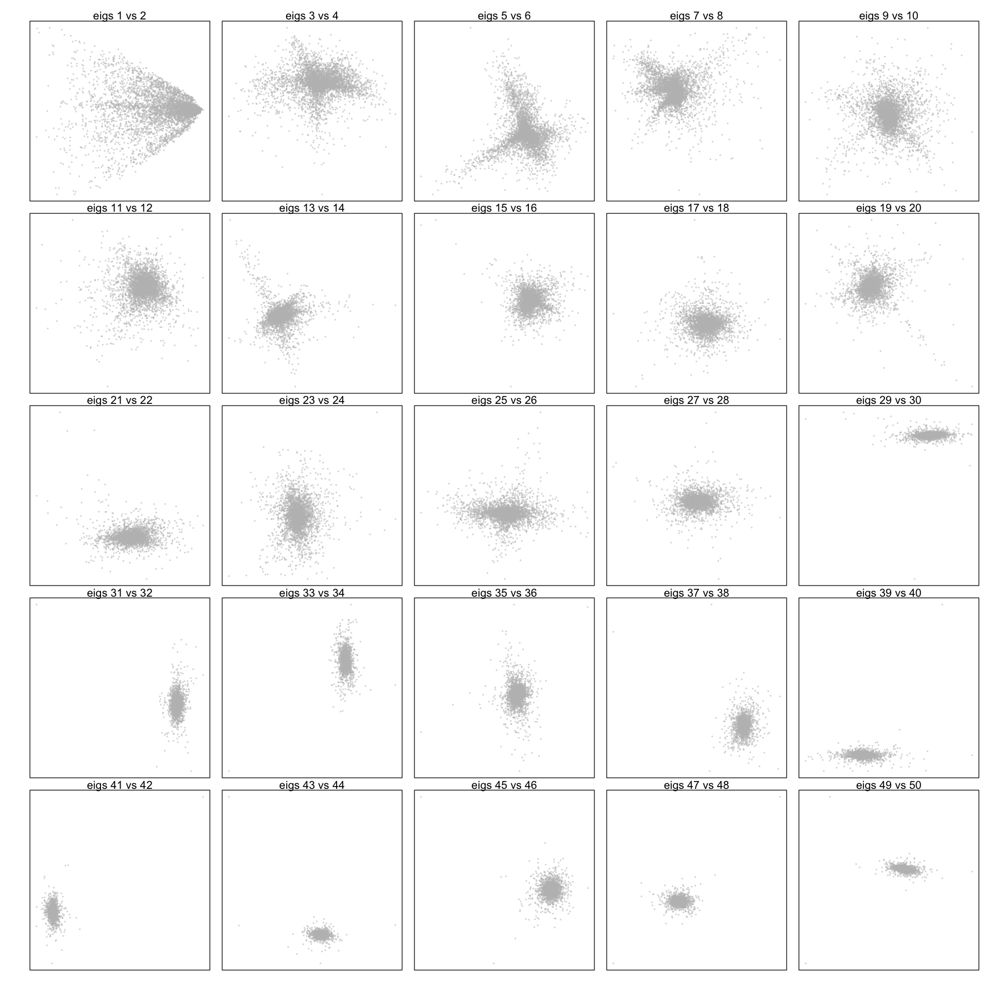

In [31]:
plotDimReductPW(obj = data, eigs.dims = 1:50, point.size = 0.3, point.color = "grey",
                point.shape = 19, point.alpha = 0.6, down.sample = 5000)

### Clustering

In this step we are going to use construct a KNN graph with the value of k = 15 based on the first 20 reduced dimensions. Then, using library `leiden` we are identifying clusters according to the KNN graph.

In [32]:
data <- runKNN(obj = data, eigs.dims = 1:20, k = 15)

In [33]:
# Louvain.lib = "leiden" won't work on ARM, switching to R-igraph instead and
# loosing resolution argument as a results. At least it workds as I didn't found
# solution for dependencies issues

data <- runCluster(obj = data, tmp.folder = tempdir(), louvain.lib = "R-igraph")

In [34]:
data@metaData$cluster <- data@cluster

As the visualization, we are computing UMAP for 2D projection of our high-dimensional space. We are going to visualize clusters, overlaps between different samples, read depth across samples, and fraction of reads per peak.

In [35]:
data <- runViz(obj = data, tmp.folder = tempdir(), dims = 2, eigs.dims = 1:20, method = "umap")

In [36]:
area_vector <- sapply(strsplit(data@sample, "_"), `[`, 1)
specimen_vector <- sapply(strsplit(data@sample, "_"), `[`, 2)

In [37]:
saveRDS(data, file = "./atac.rds")

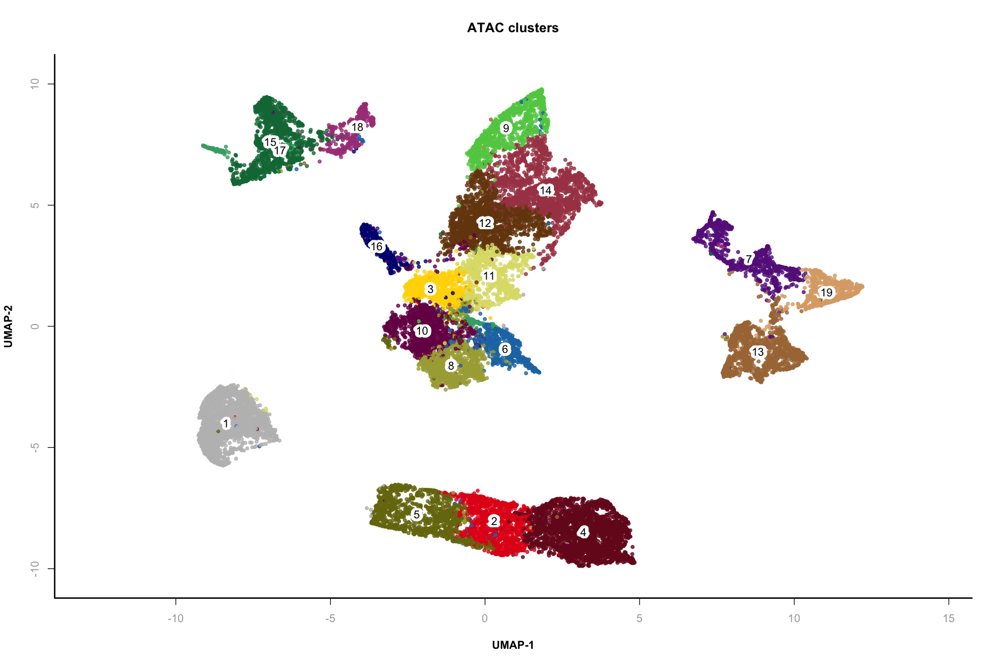

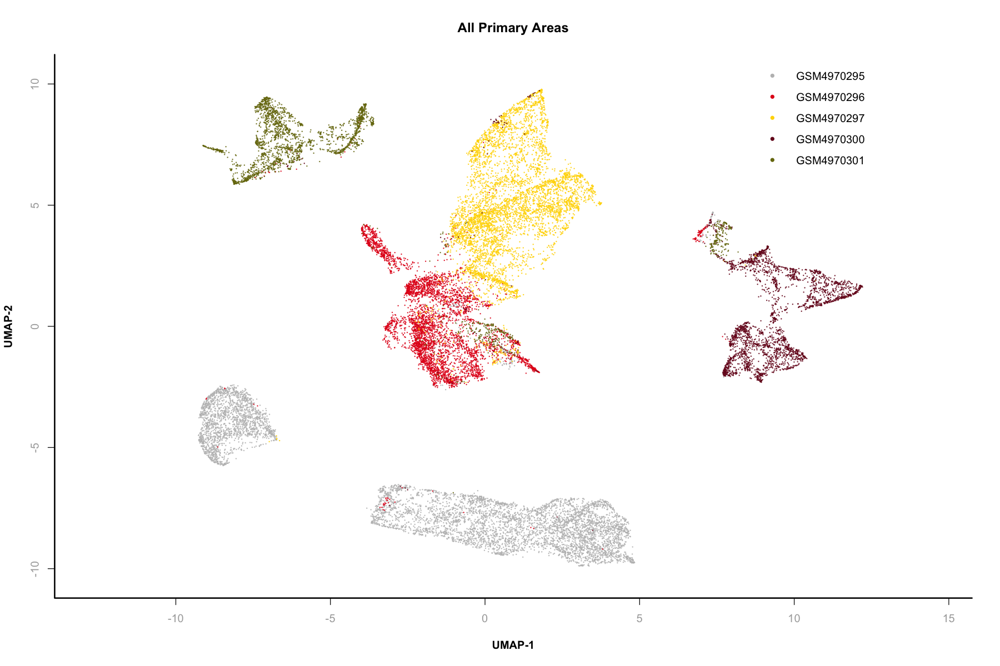

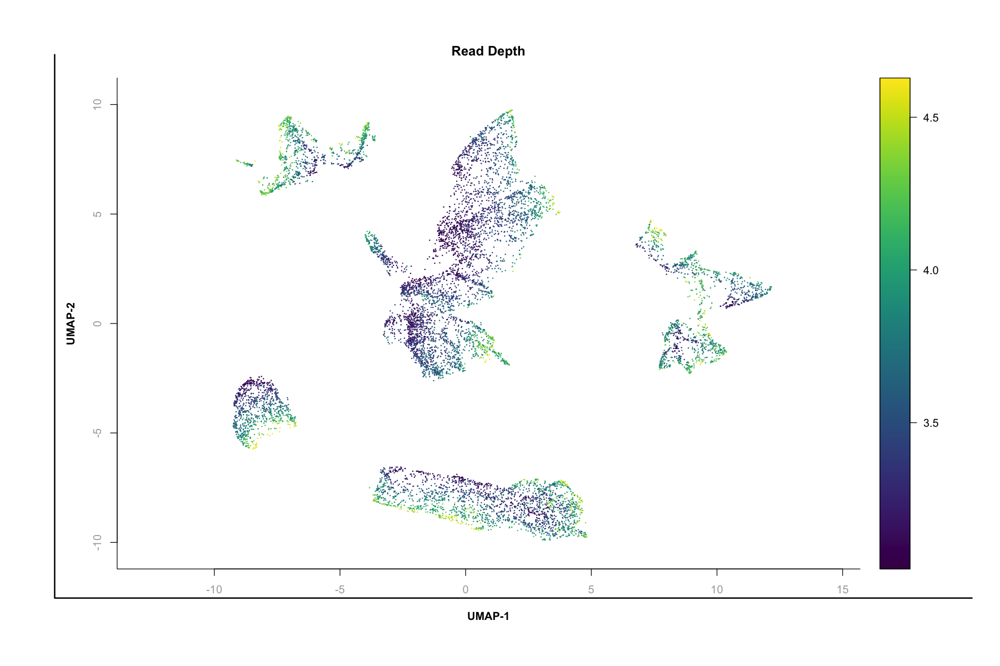

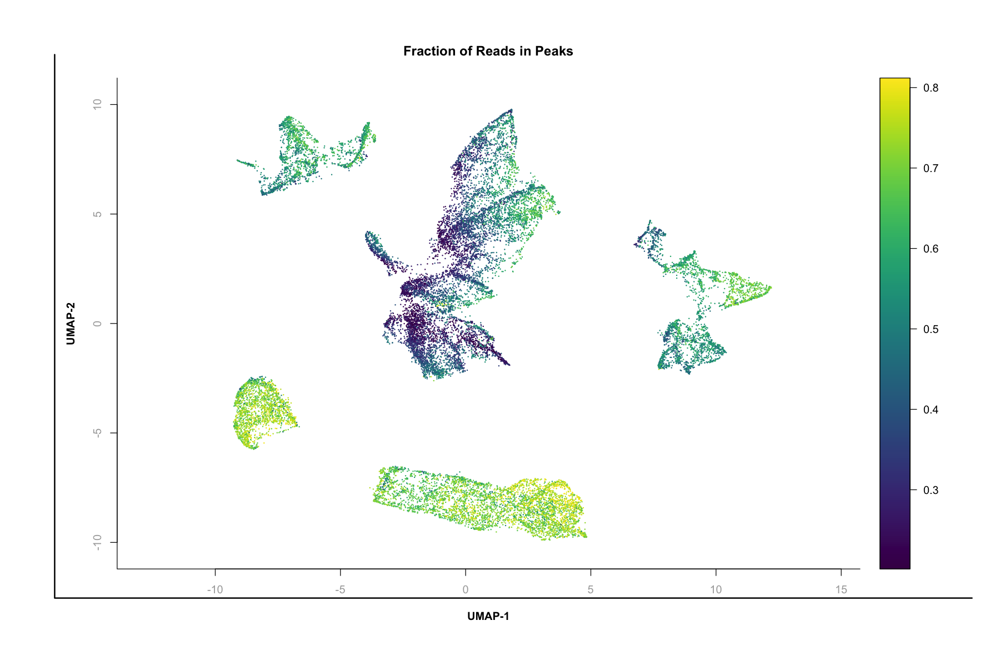

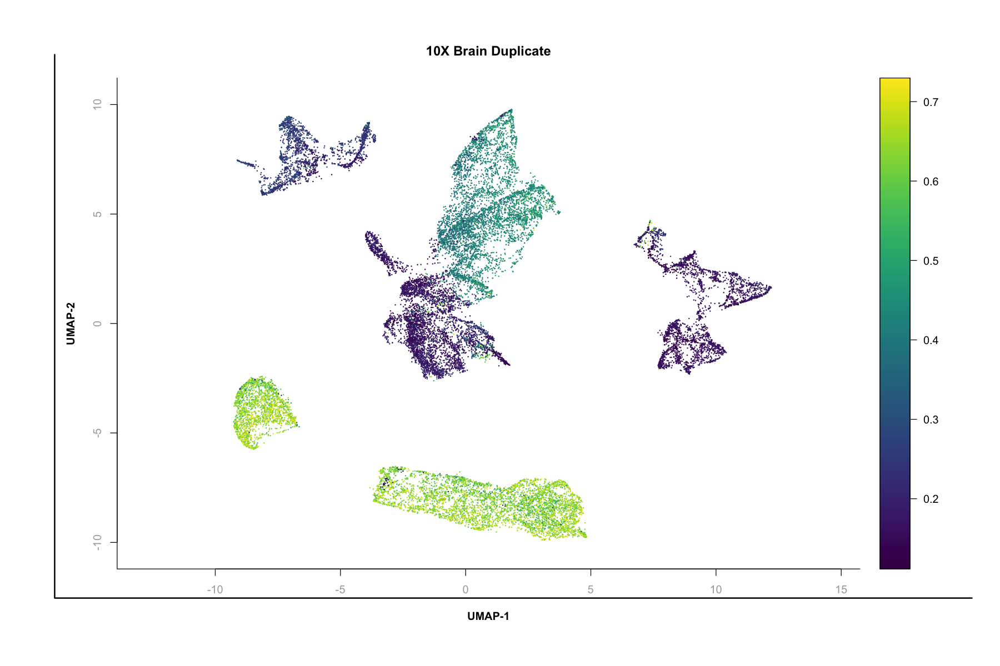

In [38]:
options(repr.plot.width = 15, repr.plot.height = 10)

plot_1 <- plotViz(obj = data, method = "umap", main = "ATAC clusters", point.color = data@cluster, 
                  point.size = 1 , point.shape = 20, point.alpha = 0.8, text.add = TRUE, 
                  text.size = 1, text.color = "black", text.halo.add = TRUE, text.halo.color = "white",
                  text.halo.width = 0.2, down.sample = 80000, legend.add = FALSE)
plot_2 <- plotViz(obj = data, method = "umap", main = "All Primary Areas", point.color = area_vector, 
                  point.size = 0.2, point.shape= 20, point.alpha = 0.8, text.add = FALSE, text.size = 1,
                  text.color = "black", text.halo.add = TRUE, text.halo.color = "white", 
                  text.halo.width = 0.1, down.sample = 80000, legend.add = T, legend.text.size = 1,
                  legend.pos = "right")
plot_3 <- plotFeatureSingle(obj = data, method = "umap", main = "Read Depth", point.size = 0.2, 
                            feature.value = log(data@metaData[, "passed_filters"] + 1, 10)$passed_filters,
                            point.shape = 20, down.sample = 10000, quantiles = c(0.01, 0.99))
plot_4 <- plotFeatureSingle(obj = data, method = "umap", main = "Fraction of Reads in Peaks",
                            feature.value = data@metaData$peak_region_fragments / data@metaData$passed_filters,
                            point.size = 0.2, point.shape = 20, down.sample = 80000, quantiles = c(0.01, 0.99))
plot_5 <- plotFeatureSingle(obj = data, feature.value = data@metaData$duplicate / data@metaData$total,
                            method = "umap", main = "10X Brain Duplicate", point.size = 0.2, point.shape=20, 
                            down.sample = 80000, quantiles = c(0.01, 0.99))

As we can see, we have identified 19 different clusters in the integrated `Snap object`, which is less than in the reference paper (23) as the data is also contain scRNA-seq datasets and higher number of  cells. We can also notice that samples do not overlap, indicating that each of them contain quite distinct cell populations.

### Batch Correction

In the paper we are referring to, authors performed batch correction using package `scAlign`, followed by integration of scRNA-seq datasets into the scATAC-seq samples. We have tried to do the same, but the results as we start to work with Seurat objects, we noticed some issues with the data as the UMAP plots didn't make any sense. So we aborted this and proceed without batch correction.

Below is the snippet of used code together with output of `scAlignMulti()` function. We did it on the remote server as R are not compatible with the ARM based TensorFlow.

In [39]:
sca <- scAlignMulti(data, options = scAlignOptions(steps = 15000, norm = TRUE, batch.norm.layer = F,
                                                   early.stop = FALSE, architecture = "small", num.dim = 32),
                   encoder.data = "LSI", supervised = "none", run.encoder = TRUE, run.decoder = F,
                   device = "CPU")

Loaded Tensorflow version 2.4.1

Found tf version: 2.4.1



[1] "============== Step 1/2: Encoder training ==============="
[1] "Graph construction"
[1] "Adding GSM4970295_organoid_13234_9week-GSM4970296_organoid_H28126_9week"
[1] "Adding GSM4970295_organoid_13234_9week-GSM4970297_organoid_H1_9week"
[1] "Adding GSM4970295_organoid_13234_9week-GSM4970300_organoid_13234_17week"
[1] "Adding GSM4970295_organoid_13234_9week-GSM4970301_organoid_H28126_24week"
[1] "Adding GSM4970296_organoid_H28126_9week-GSM4970295_organoid_13234_9week"
[1] "Adding GSM4970296_organoid_H28126_9week-GSM4970297_organoid_H1_9week"
[1] "Adding GSM4970296_organoid_H28126_9week-GSM4970300_organoid_13234_17week"
[1] "Adding GSM4970296_organoid_H28126_9week-GSM4970301_organoid_H28126_24week"
[1] "Adding GSM4970297_organoid_H1_9week-GSM4970295_organoid_13234_9week"
[1] "Adding GSM4970297_organoid_H1_9week-GSM4970296_organoid_H28126_9week"
[1] "Adding GSM4970297_organoid_H1_9week-GSM4970300_organoid_13234_17week"
[1] "Adding GSM4970297_organoid_H1_9week-GSM4970301_organoid_H2812

### Gene Based Annotation

Here we are annotating clusters based on the genomic region overlaps between annotation and our datasets. We are using annotation for GRCh38 derived from USCS in bed format for this purpose.

In [40]:
genes <- read.table("ucsc_Genes.bed")

In [41]:
# From https://support.bioconductor.org/p/78652/
extend <- function(x, upstream = 0, downstream = 0) {
    if (any(strand(x) == "*"))
        warning("'*' ranges were treated as '+'")
    on_plus <- strand(x) == "+" | strand(x) == "*"
    new_start <- start(x) - ifelse(on_plus, upstream, downstream)
    new_end <- end(x) + ifelse(on_plus, downstream, upstream)
    ranges(x) <- IRanges(new_start, new_end)
    GenomicRanges::trim(x)
}

In [42]:
gene.coords <- genes(EnsDb.Hsapiens.v86, filter = ~ gene_biotype == "protein_coding")
seqlevelsStyle(gene.coords) <- "UCSC"
genebody.coords <- keepStandardChromosomes(gene.coords, pruning.mode = 'coarse')
genebodyandpromoter.coords <- extend(x = genebody.coords, upstream = 2000, downstream = 0)

genebodypromoter.df <- as.data.frame(genebodyandpromoter.coords)
genebodypromoter.df <- genebodypromoter.df[, c(1:3, 7)]
genebodypromoter.df <- genebodypromoter.df[grep("chrM", genebodypromoter.df[, 1], invert = T), ]

In [43]:
genes <- genebodypromoter.df
genes.gr <- GRanges(genes[,1], IRanges(genes[, 2], genes[, 3]), name=genes[, 4])

In [44]:
genes.gr

GRanges object with 19919 ranges and 1 metadata column:
          seqnames            ranges strand |        name
             <Rle>         <IRanges>  <Rle> | <character>
      [1]     chr1       67091-70008      * |       OR4F5
      [2]     chr1     180393-184158      * |  FO538757.2
      [3]     chr1     184923-202322      * |  FO538757.1
      [4]     chr1     450740-453678      * |      OR4F29
      [5]     chr1     685716-688654      * |      OR4F16
      ...      ...               ...    ... .         ...
  [19915]     chrY 24831843-24907040      * |        DAZ4
  [19916]     chrY 25030901-25064548      * |       BPY2C
  [19917]     chrY 25305702-25308107      * |  AC006386.1
  [19918]     chrY 25461994-25473714      * |  AC006328.1
  [19919]     chrY 25620162-25624902      * |        CDY1
  -------
  seqinfo: 25 sequences from an unspecified genome; no seqlengths

In the cell below, we add the cell-by-bin matrix to the `Snap object`.

In [45]:
data <- addBmatToSnap(data)
data <- createGmatFromMat(obj = data, input.mat = "bmat", genes = genes.gr, do.par = TRUE, num.cores = 8)

Epoch: reading cell-bin count matrix session ...



In [46]:
data

number of barcodes: 23087
number of bins: 642098
number of genes: 19919
number of peaks: 0
number of motifs: 0

In [47]:
data <- scaleCountMatrix(obj = data, cov = data@metaData$passed_filters + 1, mat = "gmat", method = "log")

After scaling count matrix, we are using MAGIC imputation to impute gene activity scores based on the KNN Graph constructed earlier. The exact procedure of smoothing the cell-by-gene matrix is taking from the article's repository.

In [48]:
myRunMagic <- function (obj, input.mat, step.size) {
    A <- obj@graph@mat
    data.use <- obj@gmat

    A <- A + t(A)
    A <- A / Matrix::rowSums(A)
    data.use.smooth <- A %*% data.use
    
    if (step.size > 1) {
        for (i in 1:step.size) {
          data.use.smooth <- A %*% data.use.smooth
        }
    }

    slot(obj, input.mat) <- data.use.smooth
    
    return (obj)
}

In [49]:
data <- myRunMagic(obj = data, input.mat = "gmat", step.size = 3)

In [50]:
saveRDS(data, file = "./data_magic.rds")

In [51]:
marker.genes <- c("HES1", "SOX2", "GFAP", "SATB2", "NEUROD2", "EOMES", "FEZF2","TBR1",
                  "BHLHE22","HOPX","CRYAB","AIF1","OLIG1","AQP4","DLX1","LHX6")

Now we can visualize enrichment of marker genes in the dataset. List of marker genes is also taken from the paper.

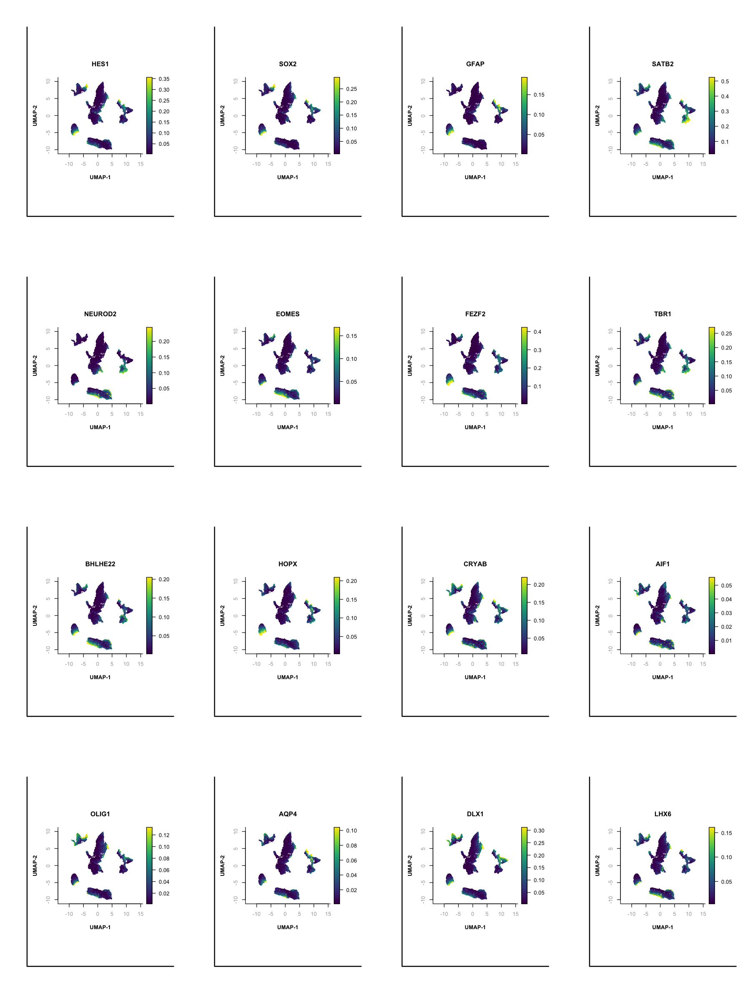

In [52]:
options(repr.plot.width = 15, repr.plot.height = 20)
par(mfrow = c(4, 4))

for (i in 1:length(marker.genes)) {
    plotFeatureSingle(obj = data, feature.value = data@gmat[, marker.genes[i]], method = "umap", 
                      main = marker.genes[i], point.size = 0.2, point.shape = 20, down.sample = 50000, 
                      quantiles = c(0.01, 0.99))
}

### Heretical Clustering

We are going to calculate the cell hierarchy by pooling cells belonging to the same clusters to create aggregated signal.

In [53]:
ensemble.ls <- lapply(split(seq(length(data@cluster)), data@cluster), function(x) {
    SnapATAC::colMeans(data[x,], mat = "bmat")
})

In [54]:
hc <- hclust(as.dist(1 - cor(t(do.call(rbind, ensemble.ls)))), method = "ward.D2")

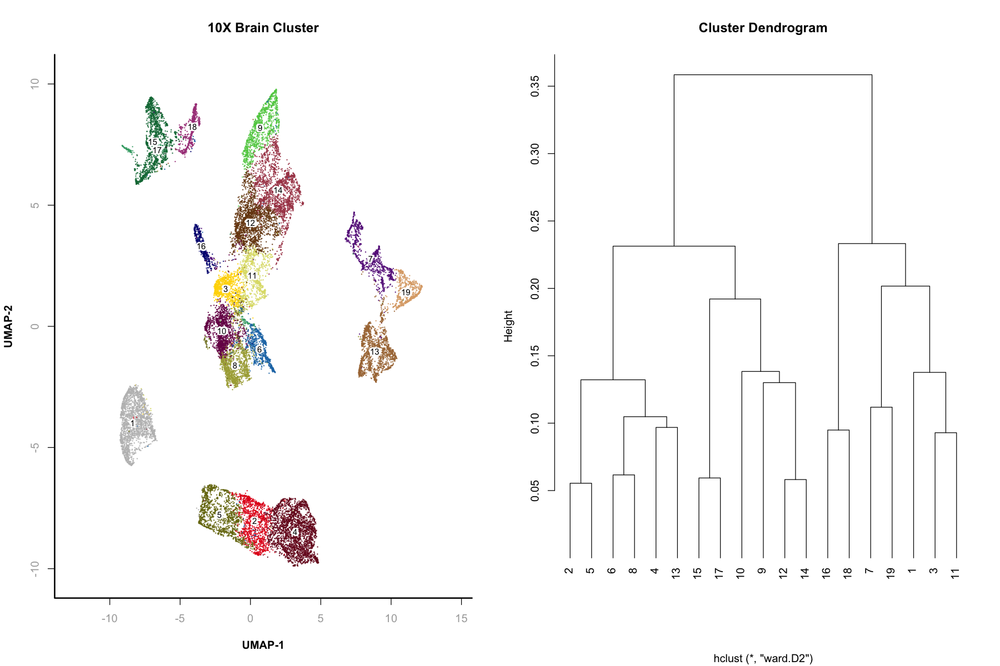

In [55]:
options(repr.plot.width = 15, repr.plot.height = 10)
par(mfrow = c(1,2))

plotViz(obj = data, method = "umap", main = "10X Brain Cluster", point.color = data@cluster, 
        point.size = 0.2, point.shape = 20, point.alpha = 0.8, text.add = TRUE, text.size = 0.75,
        text.color = "black", text.halo.add = TRUE, text.halo.color = "white", text.halo.width = 0.1,
        down.sample = 30000, legend.add = FALSE, legend.pos = "right",legend.text.size = 0.5)
plot(hc, hang = -1, xlab = "")

As we can see above, we have two large distinct groups of cells. It's impossible to make any conclusion on the cell types which are corresponding to the clusters. For that we need to include single-cell RNA-seq data to our current dataset and annotate clusters. We can `SingleR` for that as we did in the previous work, or, alternatively, as authors of the reference paper did, run `CellWalker` [package](https://github.com/pollardlab/CellWalker), which conveniently provides walk through of annotating adult brain data. Since we skipped integration step, we are not going to annotate clusters.

### Peak Identification

For the peak identification in the dataset we are using MACS2 software, installed separately from the SnapATAC pipeline. However, it implements a helper function, so we need to specify in the arguments model, some technical details, and path to the MACS2 executable. We are going to find peaks for every single of the clusters in our dataset.

In [56]:
saveRDS(data, "./data_pre_peaks.rds")

In [57]:
data <- readRDS("./data_pre_peaks.rds")

In [58]:
peaks <- runMACSForAll(obj = data, path.to.snaptools = "/opt/homebrew/Caskroom/miniforge/base/bin/snaptools",
                       path.to.macs = "/opt/homebrew/Caskroom/miniforge/base/bin/macs2", 
                       output.prefix = "AllPrimary_downsampled", num.cores = 8, min.cells = 50, 
                       gsize = "hs", buffer.size = 500, tmp.folder = tempdir(),
                       macs.options = "--nomodel --shift -37 --ext 73 --qval 5e-2 -B --SPMR")

As a result of running `runMACSForAll`, we obtained the following object which includes information on the genomic interval on the chromosome. Also, it produced `narrowPeak` files and `.bedGraph` files that we can used to visualize results in the IGV.

In [59]:
peaks

GRanges object with 396955 ranges and 0 metadata columns:
           seqnames            ranges strand
              <Rle>         <IRanges>  <Rle>
       [1]  b'chr1'     180807-180914      *
       [2]  b'chr1'     181310-181525      *
       [3]  b'chr1'     190790-191017      *
       [4]  b'chr1'     191214-191556      *
       [5]  b'chr1'     267928-268007      *
       ...      ...               ...    ...
  [396951]  b'chrY' 26671327-26671410      *
  [396952]  b'chrY' 26671452-26671560      *
  [396953]  b'chrY' 56832332-56832405      *
  [396954]  b'chrY' 56847964-56848037      *
  [396955]  b'chrY' 56877741-56877814      *
  -------
  seqinfo: 24 sequences from an unspecified genome; no seqlengths

In [60]:
saveRDS(peaks, "./peaks.rds")

In [61]:
peaks.names <- system("ls | grep narrowPeak", intern = TRUE)

In [62]:
peak.gr.ls <- lapply(peaks.names, function(x) {
    peak.df <- read.table(x)
    GRanges(peak.df[,1], IRanges(peak.df[,2], peak.df[,3]))})

In [63]:
peak.gr <- reduce(Reduce(c, peak.gr.ls))
peak.gr

GRanges object with 396955 ranges and 0 metadata columns:
           seqnames            ranges strand
              <Rle>         <IRanges>  <Rle>
       [1]  b'chr1'     180807-180914      *
       [2]  b'chr1'     181310-181525      *
       [3]  b'chr1'     190790-191017      *
       [4]  b'chr1'     191214-191556      *
       [5]  b'chr1'     267928-268007      *
       ...      ...               ...    ...
  [396951]  b'chrY' 26671327-26671410      *
  [396952]  b'chrY' 26671452-26671560      *
  [396953]  b'chrY' 56832332-56832405      *
  [396954]  b'chrY' 56847964-56848037      *
  [396955]  b'chrY' 56877741-56877814      *
  -------
  seqinfo: 24 sequences from an unspecified genome; no seqlengths

Let's visualize peaks for the second cluster using IGV. But first, we need to work little awk magic and convert it to `.tdf` as the file is very large.

In [64]:
system("awk '{gsub(/b|'\''/,"",$1)}1' AllPrimary_downsampled.2_treat_pileup.bdg > vis.bdg")

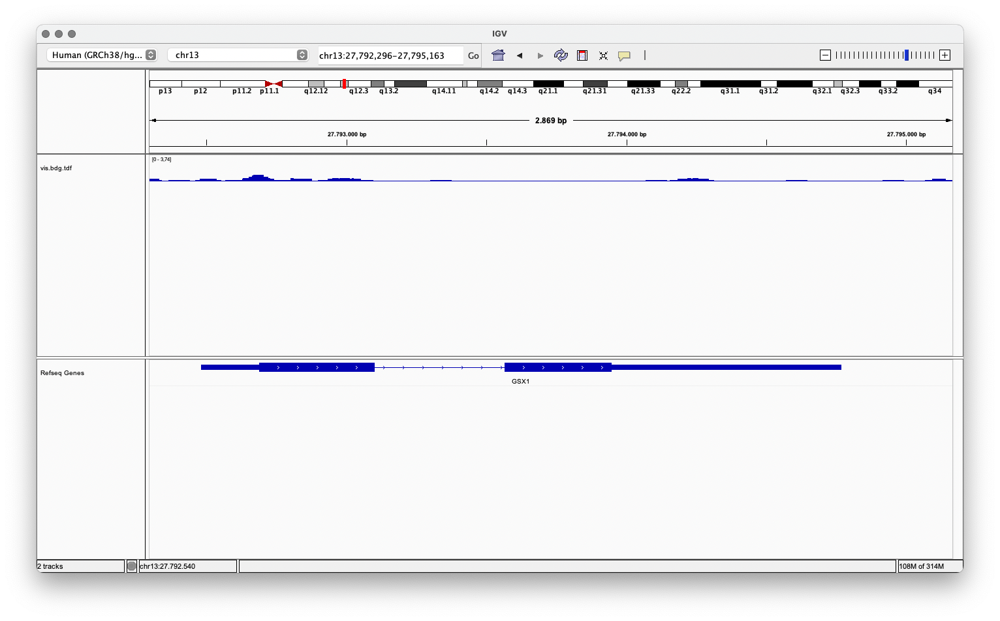

### Adding Peaks to Snap Objects

Here we are adding peaks to the individual datasets and later steps incorporating them into the dataset.

In [65]:
peaks.df <- as.data.frame(peak.gr)[, 1:3]

In [66]:
write.table(peaks.df,file = "peaks.combined.bed",append = FALSE, quote = FALSE, sep = "\t", 
            eol = "\n", na = "NA", dec = ".", row.names = FALSE, col.names = FALSE, 
            qmethod = c("escape", "double"), fileEncoding = "")

Steps below require BEDTools.

In [67]:
system("snaptools snap-add-pmat --snap-file GSM4970295_organoid_13234_9week.snap --peak-file peaks.combined.bed")

In [68]:
system("snaptools snap-add-pmat --snap-file GSM4970296_organoid_H28126_9week.snap --peak-file peaks.combined.bed")

In [69]:
system("snaptools snap-add-pmat --snap-file GSM4970297_organoid_H1_9week.snap --peak-file peaks.combined.bed")

In [70]:
system("snaptools snap-add-pmat --snap-file GSM4970300_organoid_13234_17week.snap --peak-file peaks.combined.bed")

In [71]:
system("snaptools snap-add-pmat --snap-file GSM4970301_organoid_H28126_24week.snap --peak-file peaks.combined.bed")

In [72]:
data <- addPmatToSnap(data)

Epoch: reading cell-peak count matrix session ...



In [73]:
data

number of barcodes: 23087
number of bins: 642098
number of genes: 19919
number of peaks: 396955
number of motifs: 0

We can see that now we have incorporated almost 400 thousand peaks into our dataset.

In [74]:
saveRDS(data, file = "data_peaks.rds")

In [75]:
data <- readRDS("./data_peaks.rds")

### Differentially Accessible Regions

We are going to use differential analysis to find DARs. First, we will identified positive peaks for a first cluster, which is compared to a group of negative control cells.

In [76]:
DARs <- findDAR(obj = data, input.mat = "pmat", cluster.pos = 1, cluster.neg.method = "knn",
                test.method = "exactTest", bcv = 0.4)

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...



In [77]:
DARs$FDR <- p.adjust(DARs$PValue, method = "BH")
idy <- which(DARs$FDR < 5e-2 & DARs$logFC > 0)

In [78]:
covs <- Matrix::rowSums(data@pmat)
vals <- Matrix::rowSums(data@pmat[, idy]) / covs
vals.zscore <- (vals - mean(vals)) / sd(vals)

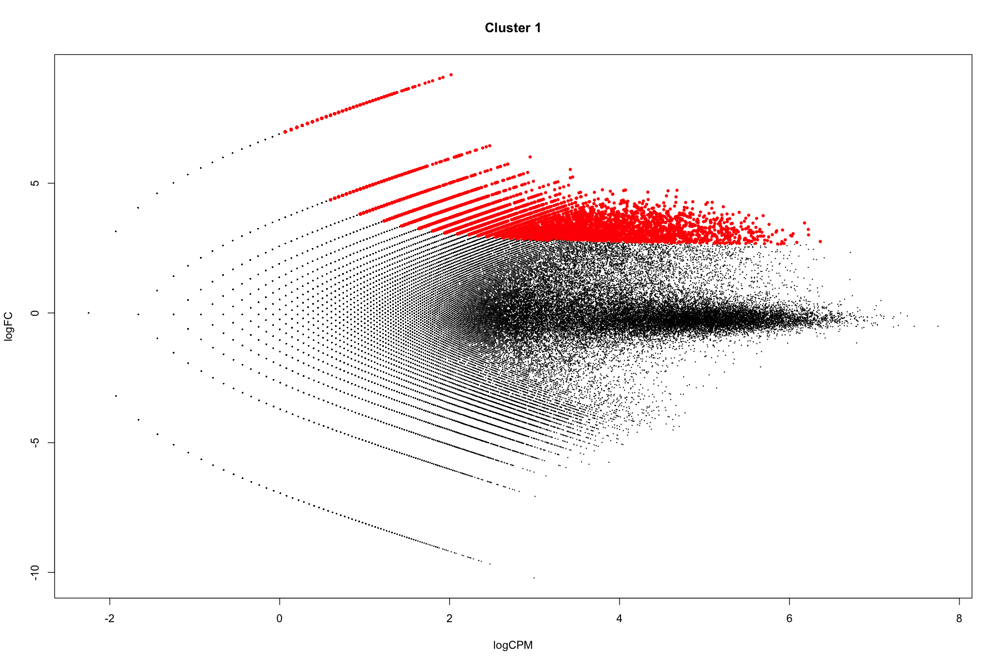

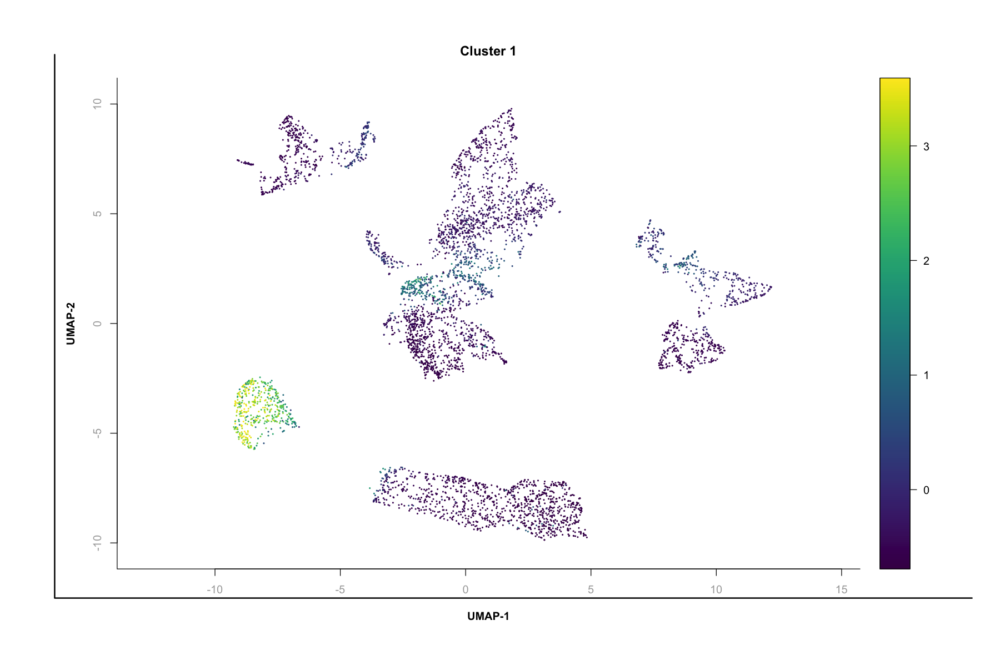

In [79]:
options(repr.plot.width = 15, repr.plot.height = 10)

plot(DARs$logCPM, DARs$logFC, pch = 19, cex = 0.1, ylab = "logFC", xlab = "logCPM", main = "Cluster 1")
points(DARs$logCPM[idy], DARs$logFC[idy], pch = 19, cex = 0.5, col = "red")

plotFeatureSingle(obj = data, feature.value = vals.zscore, method = "umap", main = "Cluster 1",
                  point.size = 0.3, point.shape = 20, down.sample = 5000, quantiles = c(0.01, 0.99))

From the plot above, we can see that some of the peak of cluster 1 is also present in other locations, though they are not so abundant. Now we are going to apply it to every clusters. For clusters consisting of small amount of cells the statistical power is low and the peak ranking is done based on the 2000 peaks enrichment.

In [80]:
idy.ls <- lapply(levels(data@cluster), function(cluster_i) {
        DARs <- findDAR(obj = data, input.mat = "pmat", cluster.pos = cluster_i, cluster.neg = NULL,
                       cluster.neg.method = "knn", bcv = 0.2, test.method = "exactTest")

        DARs$FDR <- p.adjust(DARs$PValue, method = "BH")
        idy <- which(DARs$FDR < 5e-2 & DARs$logFC > 0)

        if (length(idy) < 1000L) {
            PValues <- DARs$PValue
            PValues[DARs$logFC < 0] <- 1
            idy <- order(PValues, decreasing=FALSE)[1:1000]
        }
        idy
    }
)

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive cluster ...

Epoch: checking inputs ...

Epoch: identifying DARs for positive

In [81]:
names(idy.ls) <- levels(data@cluster)

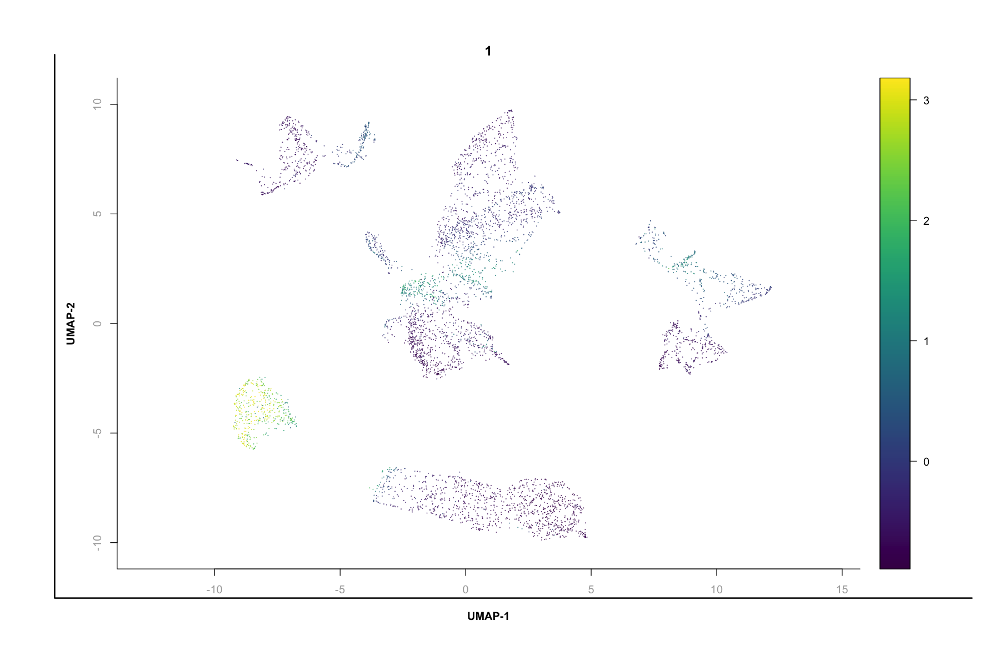

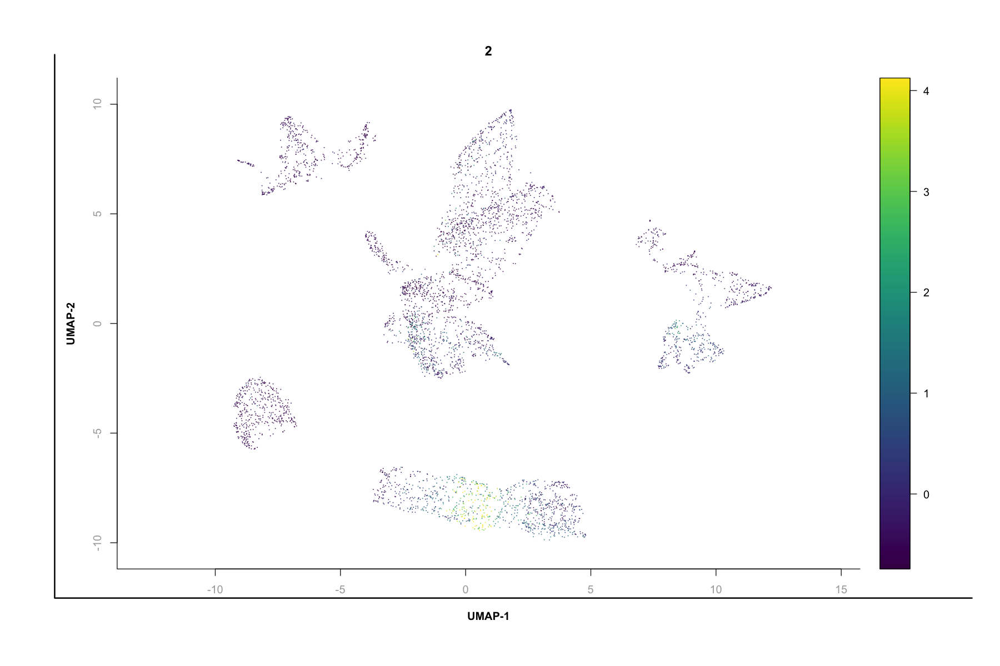

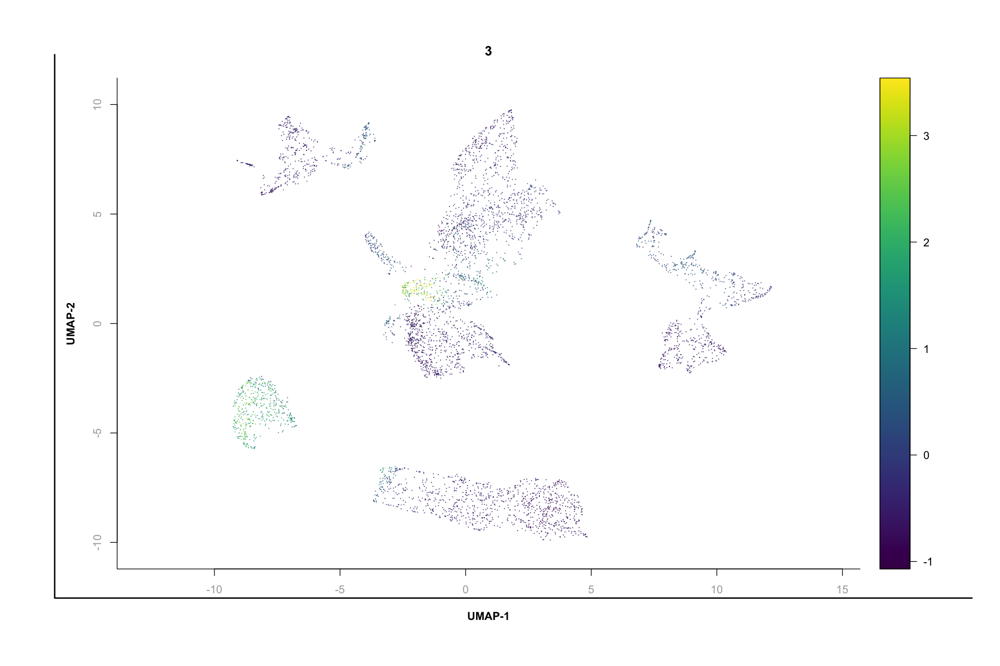

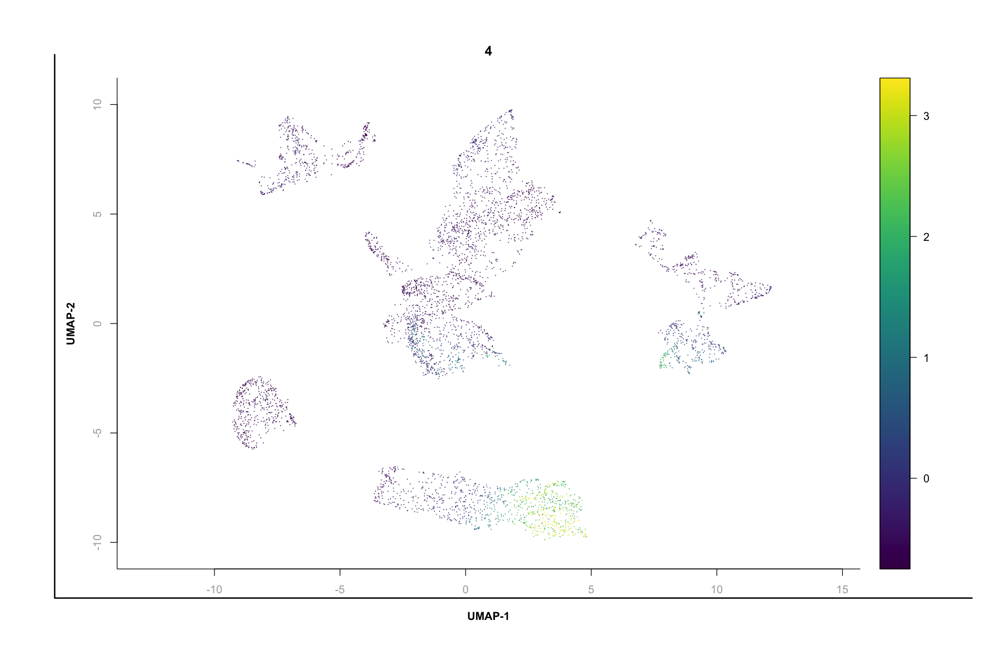

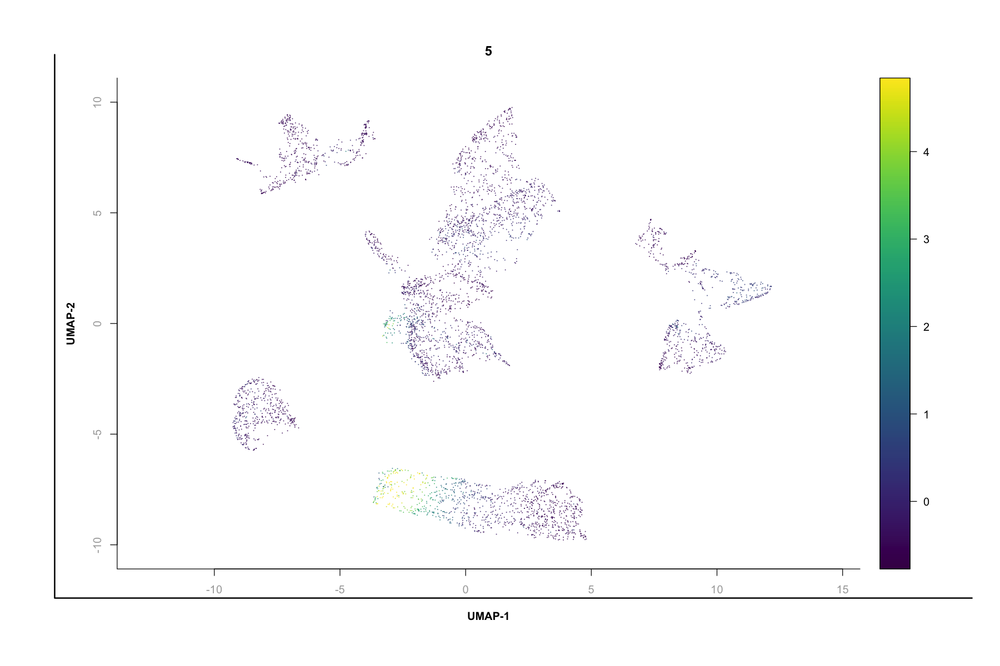

...

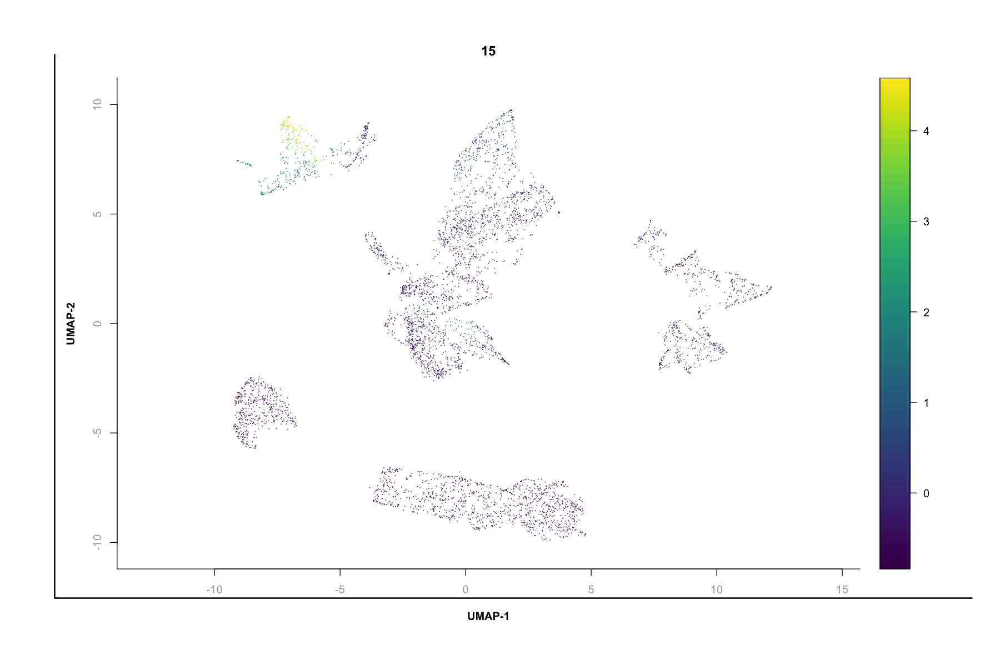

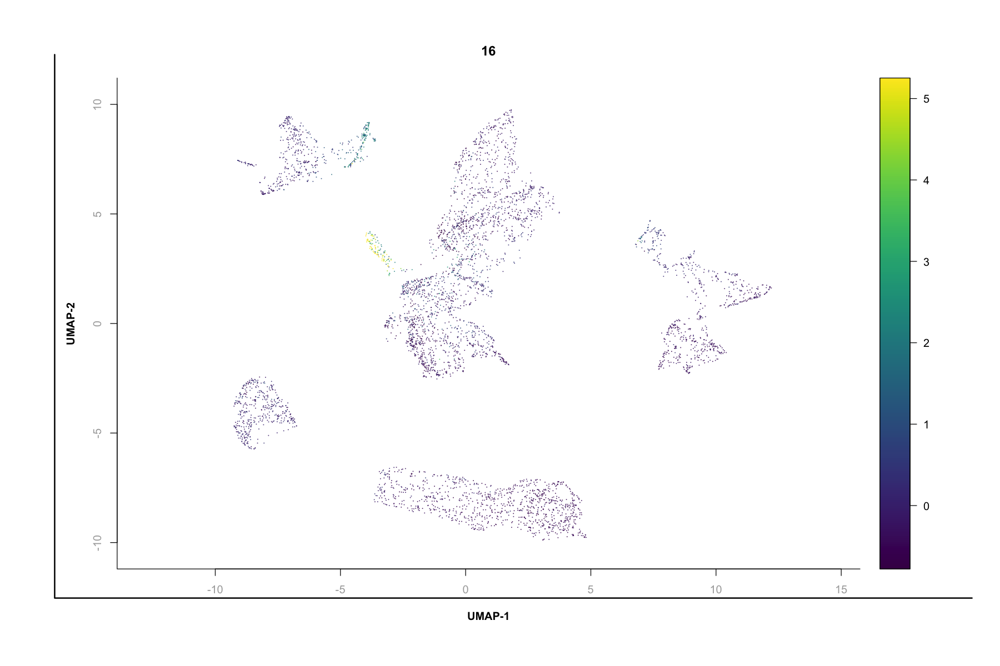

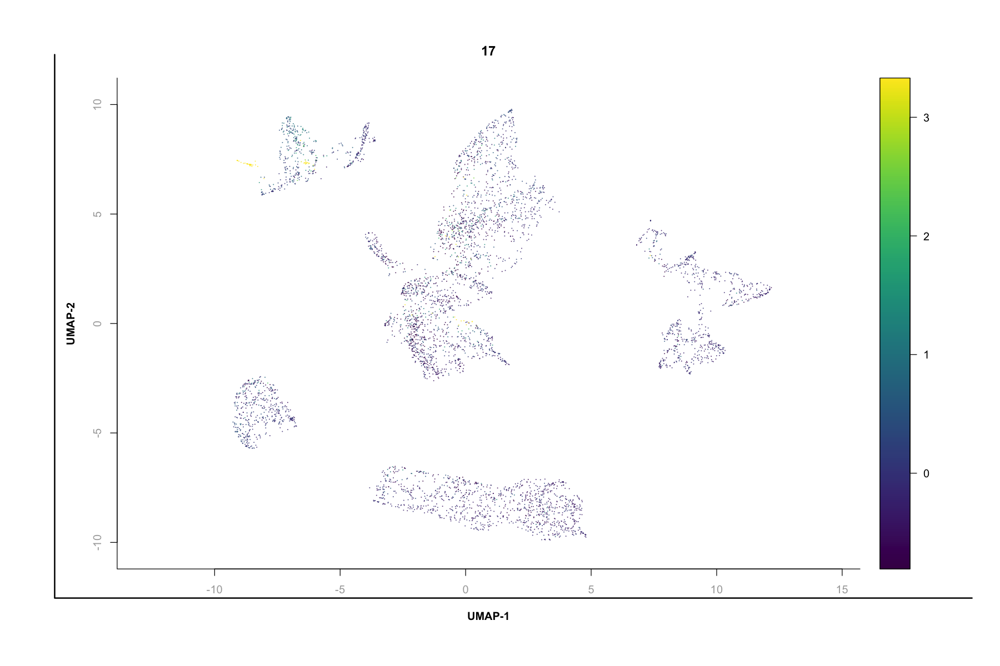

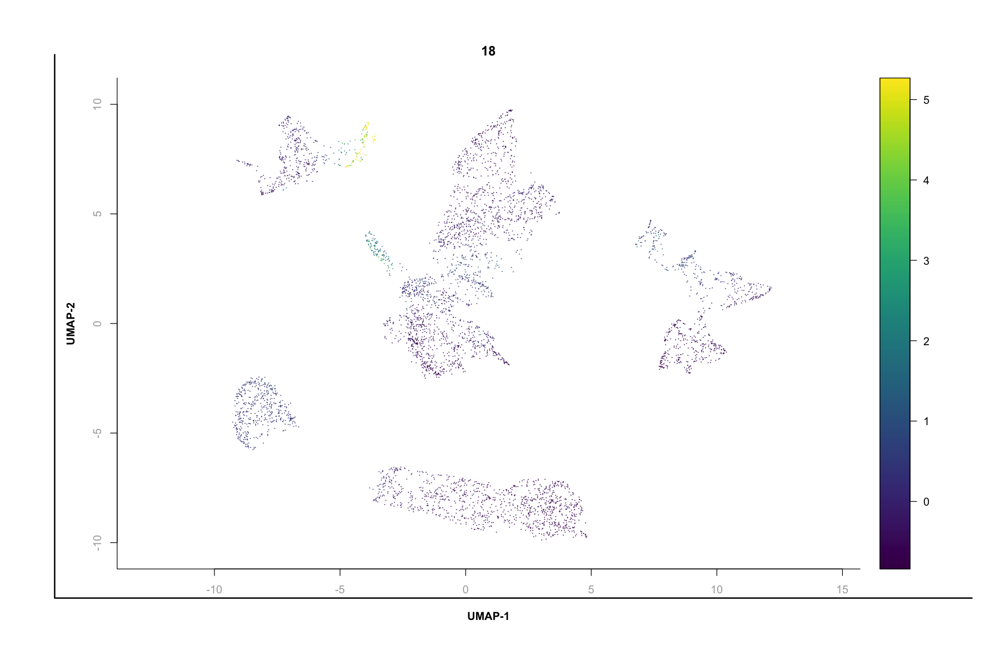

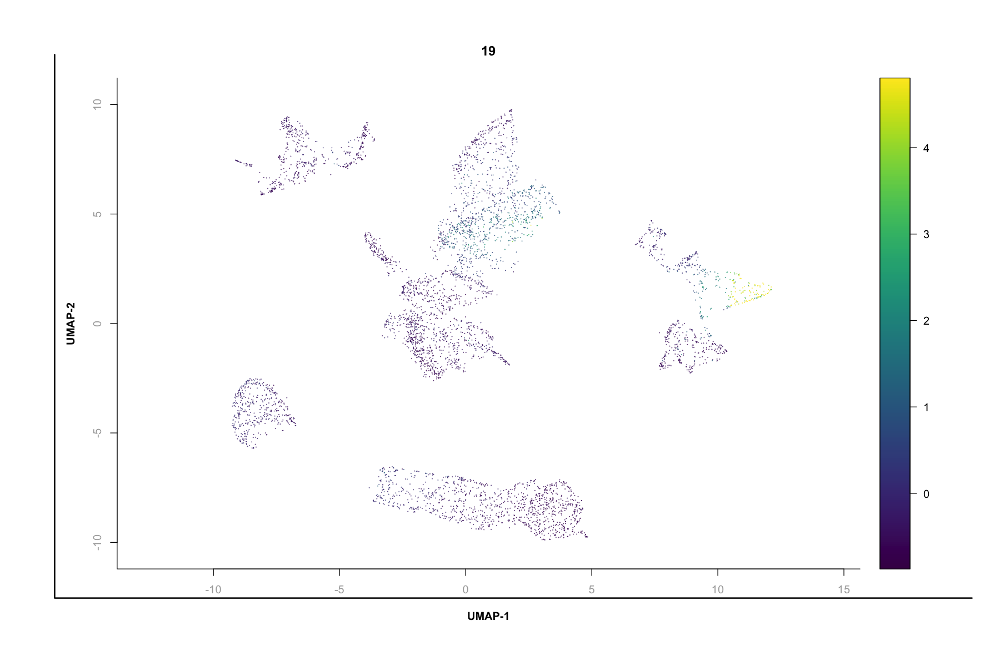

In [82]:
for(cluster_i in levels(data@cluster)) {
    idy <- idy.ls[[cluster_i]]
    vals <- Matrix::rowSums(data@pmat[, idy]) / covs
    vals.zscore <- (vals - mean(vals)) / sd(vals)
  
    plotFeatureSingle(obj = data, feature.value = vals.zscore, method = "umap", main = cluster_i, 
                    point.size = 0.1, point.shape = 20, down.sample = 5000, quantiles = c(0.01, 0.99))
}

### Motif Identification

For motif discovery we are going to use [Homer](http://homer.ucsd.edu/homer/), which is suitable for finding motifs of 8-20 base pair length. `SnapATAC` has a wrapper function which runs Homer, but we need to install Homer first, as well as various dependencies such as samtools including R packages `DESeq2` and `edgeR`. First, we are working with the data in peaks as in previous step (peak identification) it added characters `b'` to the chromosomes names. Also, before running Homer we need to download the reference using perl script provided by the software otherwise it won't run.

In [83]:
# Changing chromosome names: from b'chr1 to chr1
# From https://github.com/r3fang/SnapATAC/issues/202

tmp_gr <- as.data.frame(data@peak)
tmp_seqnames <- as.character(tmp_gr[,1])
tmp_seqnames_new <- str_replace( str_replace(tmp_seqnames, "b'", ""), "'", "")
tmp_gr[, 1] <- tmp_seqnames_new
tmp_names <- as.character(tmp_gr[,6])
tmp_names_new <- str_replace( str_replace(tmp_names, "b'", ""), "'", "")
tmp_gr[, 6] <- tmp_names_new
tmp_gr_new <- makeGRangesFromDataFrame(tmp_gr, keep.extra.columns = TRUE)
data@peak <- tmp_gr_new

In [84]:
# Homer politely ask to install hg38
motifs <- list()
for (i in 1:length(idy.ls)) {
    motifs[[i]] <- runHomer(data[, idy.ls[[i]], "pmat"], mat = "pmat", 
                            path.to.homer = "/opt/homebrew/Caskroom/miniforge/base/bin/findMotifsGenome.pl",
                            result.dir = paste0("res", levels(data@cluster)[i], "_HOMER"), num.cores = 8, 
                            genome = "hg38", motif.length = 10, scan.size = 300, optimize.count = 25, 
                            local.background = FALSE, only.known = TRUE, only.denovo = FALSE, fdr.num = 1, 
                            cache = 100, overwrite = TRUE, keep.minimal = FALSE)
}

In [85]:
motifs

PFMatrixList of length 386
names(386): MA0025.1_NFIL3 MA0030.1_FOXF2 ... MA0909.1_HOXD13 MA0914.1_ISL2

We found 229 motifs for the first cluster, 108 motifs for the second, and so on. Below is the Homer output of the top 5 motifs for the first and second cluster.

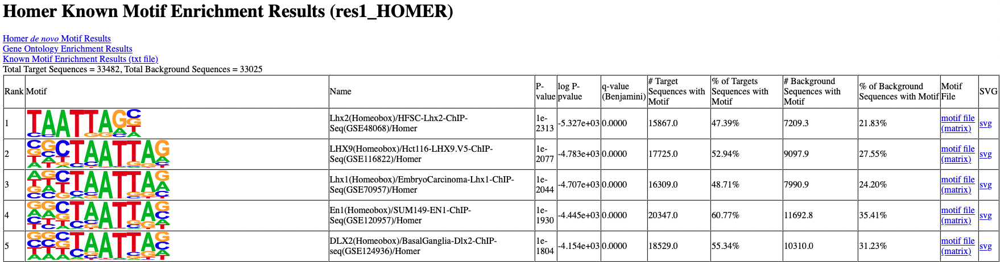

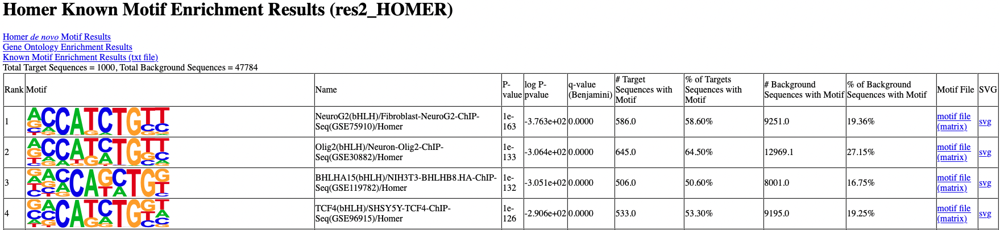

###  Motif Variability Analysis

Additionally, we performed motif variability analysis using package `chromVAR`. SnapATAC includes a wrapper function `runChromVAR` that runs `chromVAR` pipeline. As the input, it takes the aligned fragments from ATAC-seq and the genomic annotation. As before, we are using annotation for GRCh38 which is available through the package `BSgenome.Hsapiens.UCSC.hg38`. It computes for each annotation and sample a bias corrected deviation.

We are following the pipeline: from the dataset we are obtaining peaks, pmat matrix, then we are creating object of `SummarizedExperiment` (though other data types also can be used as input), then we are adding GC bias, getting motifs, matching them with the reference, and computing deviation.

In [86]:
data <- makeBinary(data, "pmat")

In [87]:
data@mmat <- runChromVAR(obj = data, input.mat = "pmat", genome = BSgenome.Hsapiens.UCSC.hg38,
                         min.count = 10, species = "Homo sapiens")

# We are running into the problem in the very last step (computing deviation). There are main
# function compute_deviations_core and helper function compute_deviations_single. There is bapply call within
# main function, which calls compute_deviations_single. The issues is when we are calling
# compute_deviations_single, it creates couple of sparse matrices and for SOME REASONS it cannot multiply them!
# I checked source code and I've added as.matrix to convert them from sparse matrix to simple matrix and it works.
# I left comments where changes were applied. Loosing in speed though

ERROR: Error in idx[[1]]: subscript out of bounds


In [88]:
# Input helper functions
counts_check <- function(object) {
  stopifnot(is(object, "SummarizedExperiment"))
  stopifnot("counts" %in% assayNames(object))
  stopifnot(min(assays(object)$counts) >= 0)
  stopifnot(canCoerce(assays(object)$counts, "Matrix"))
  stopifnot(ncol(object) > 1)
  if (!is(assays(object)$counts, "Matrix")) 
    assays(object)$counts <- Matrix::Matrix(assays(object)$counts)
  return(object)
}
matches_check <- function(object) {
  stopifnot(is(object, "SummarizedExperiment"))
  stopifnot("matches" %in% assayNames(object) ||
              "annotationMatches" %in% assayNames(object) ||
              "annotation_matches" %in% assayNames(object) ||
              "motif_matches" %in% assayNames(object) ||
              "motifMatches" %in% assayNames(object))
  stopifnot(canCoerce(annotationMatches(object), "lMatrix"))
  if (!is(annotationMatches(object), "lMatrix")) {
    annotationMatches(object) <- as(annotationMatches(object), "lMatrix")
    warning("Annotation object matches converted to logical")
  }
  return(object)
}
convert_to_ix_list <- function(ix) {
  stopifnot(inherits(ix, "Matrix") || inherits(ix, "matrix"))
  if (inherits(ix, "sparseMatrix")) {
    tmp <- summary(ix)
    tmp$j <- factor(tmp$j, levels = seq_len(ncol(ix)), ordered = TRUE)
    out <- split(tmp$i, tmp$j)
  } else {
    out <- lapply(seq_len(ncol(ix)), function(x) which(ix[, x]))
  }
  names(out) <- colnames(ix)
  return(out)
}

# Main function
compute_deviations_core <- function(counts_mat,
                                    peak_indices,
                                    background_peaks,
                                    expectation,
                                    rowData = NULL,
                                    colData = NULL) {

  if (min(getFragmentsPerPeak(counts_mat)) <= 0)
    stop("All peaks must have at least one fragment in one sample")

  stopifnot(nrow(counts_mat) == nrow(background_peaks))
  stopifnot(length(expectation) == nrow(counts_mat))

  if (is.null(colData))
    colData <- DataFrame(seq_len(ncol(counts_mat)),
                         row.names = colnames(counts_mat))[,FALSE]

  # check that indices fall within appropriate bounds
  tmp <- unlist(peak_indices, use.names = FALSE)
  if (is.null(tmp) ||
      !(all.equal(tmp, as.integer(tmp))) ||
      max(tmp) > nrow(counts_mat) ||
      min(tmp) < 1) {
    stop("Annotations are not valid")
  }

  if (is.null(names(peak_indices))) {
    names(peak_indices) <- seq_along(peak_indices)
  }

  sample_names <- colnames(counts_mat)

  results <- bplapply(peak_indices,
                      compute_deviations_single,
                      counts_mat = counts_mat,
                      background_peaks = background_peaks,
                      expectation = expectation)

  z <- t(vapply(results, function(x) x[["z"]], rep(0, ncol(counts_mat))))
  dev <- t(vapply(results, function(x) x[["dev"]], rep(0, ncol(counts_mat))))

  colnames(z) <- colnames(dev) <- sample_names

  rowData$fractionMatches <- vapply(results, function(x) x[["matches"]], 0)
  rowData$fractionBackgroundOverlap <- vapply(results, 
                                              function(x) x[["overlap"]], 
                                              0)
  
  out <- SummarizedExperiment(assays = list(deviations = dev, z = z),
                              colData = colData,
                              rowData = rowData)

  return(new("chromVARDeviations", out))
}

# Helper function
compute_deviations_single <- function(peak_set,
                                      counts_mat,
                                      background_peaks,
                                      expectation = NULL,
                                      intermediate_results = FALSE,
                                      threshold = 1) {

  if (length(peak_set) == 0) {
    return(list(z = rep(NA, ncol(counts_mat)), dev = rep(NA, ncol(counts_mat)),
                matches = 0, overlap = NA))
  }

  fragments_per_sample <- colSums(counts_mat)

  ### counts_mat should already be normed!
  tf_count <- length(peak_set)
  if (tf_count == 1) {
    observed <- as.vector(counts_mat[peak_set, ])
    expected <- expectation[peak_set] * fragments_per_sample
    observed_deviation <- (observed - expected)/expected
    sampled <- counts_mat[background_peaks[peak_set, ], ]
    sampled_expected <- outer(expectation[background_peaks[peak_set, ]],
                              fragments_per_sample)
    sampled_deviation <- (sampled - sampled_expected)/sampled_expected
    bg_overlap <- sum(background_peaks[peak_set,] == peak_set[1]) / 
      ncol(background_peaks)
  } else {
    tf_vec <- sparseMatrix(j = peak_set,
                           i = rep(1, tf_count),
                           x = 1,
                           dims = c(1,
                                    nrow(counts_mat)))

    observed <- as.vector(as.matrix(tf_vec) %*% counts_mat) # Added as.matrix
    expected <- as.vector(as.matrix(tf_vec) %*% expectation %*% fragments_per_sample) # Added as.matrix
    observed_deviation <- (observed - expected)/expected
    niterations <- ncol(background_peaks)
    sample_mat <-
      sparseMatrix(j = 
                     as.vector(background_peaks[peak_set, 
                                                seq_len(niterations)]),
                   i = rep(seq_len(niterations), each = tf_count),
                   x = 1,
                   dims = c(niterations,
                            nrow(counts_mat)))

    sampled <- as.matrix(as.matrix(sample_mat) %*% counts_mat) # Added as.matrix
    sampled_expected <- as.matrix(as.matrix(sample_mat) %*% expectation %*% 
                                    fragments_per_sample) # Added as.matrix
    sampled_deviation <- (sampled - sampled_expected)/sampled_expected

    bg_overlap <- mean(as.matrix(sample_mat) %*% t(as.matrix(tf_vec))) / tf_count # Added as.matrix
  }

  fail_filter <- which(expected < threshold)

  mean_sampled_deviation <- colMeans(sampled_deviation)
  sd_sampled_deviation <- apply(sampled_deviation, 2, sd)

  normdev <- (observed_deviation - mean_sampled_deviation)
  z <- normdev/sd_sampled_deviation

  if (length(fail_filter) > 0) {
    z[fail_filter] <- NA
    normdev[fail_filter] <- NA
  }

  if (intermediate_results) {
    out <- list(z = z, dev = normdev,
                observed = observed,
                sampled = sampled,
                expected = expected,
                sampled_expected = sampled_expected,
                observed_deviation = observed_deviation,
                sampled_deviation = sampled_deviation,
                matches = tf_count / nrow(counts_mat),
                overlap = bg_overlap)
  } else {
    out <- list(z = z, dev = normdev, matches = tf_count / nrow(counts_mat),
                overlap = bg_overlap)
  }
  return(out)
}

In [89]:
# Running pipeline steps individually
peaks.gr <- data_test@peak
mat <- data_test@pmat
idy <- which(Matrix::colSums(mat) > 10)
rse <- SummarizedExperiment(assays = list(counts = t(mat[,idy])), rowRanges = peaks.gr[idy], 
                            colData = DataFrame(Cell_Type = 1:nrow(mat), depth = Matrix::rowSums(mat)))
rse <- addGCBias(rse, genome = BSgenome.Hsapiens.UCSC.hg38)
motifs <- getJasparMotifs(collection = "CORE")
motif_matched <- matchMotifs(motifs, rse, genome = BSgenome.Hsapiens.UCSC.hg38)

# Converting objects for input
object <- counts_check(rse)
annotations <- matches_check(motifs)
peak_indices <- convert_to_ix_list(annotationMatches(motifs))
background_peaks <- getBackgroundPeaks(object)
expectation <- computeExpectations(object)

In [90]:
dev <- compute_deviations_core(counts(object), peak_indices, background_peaks, expectation, 
                               colData = colData(object),rowData = colData(annotations))
dev_mat <- t(assay(dev))
data@mmat <- dev_mat

After debugging, we finally have the deviation matrix that we are going to integrate into the dataset. We have identified 386 differentially expressed motifs across all clusters.

In [91]:
data

number of barcodes: 23087
number of bins: 642098
number of genes: 19919
number of peaks: 396955
number of motifs: 386

In [92]:
saveRDS(data, file = "./data_chrom_var.rds")

As the example, we will see the variability of GSX1 motif across the clusters.

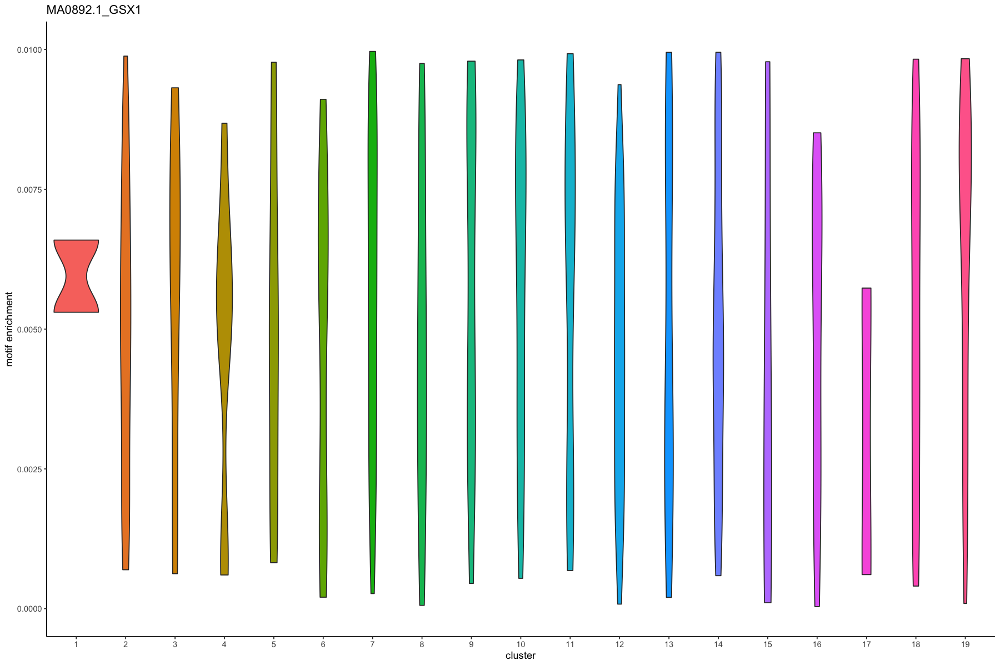

In [93]:
motif_i <- grep("GSX1", colnames(data@mmat), value = T)[1]
dat <- data.frame(x = data@metaData[, "cluster"], y = data@mmat[, motif_i])

ggplot(dat, aes(x = cluster, y = y, fill = cluster)) + theme_classic() + geom_violin() + 
    xlab("cluster") + ylab("motif enrichment") + ylim(0, 0.01) + ggtitle(motif_i) + theme(legend.position = "none")

## Conclusion

In this work we run SnapATAC pipeline to analyze scATAC-seq datasets. We worked with 5 samples, which differs in iPSC cell line origin, and developmental stages. We performed QC, clustering, gene annotation, peak calling. Additionally, we found differentially accessible regions as well as motifs and motifs variability cross 19 previously identified clusters. Apart from using SnapATAC pipeline, we used extra tools like MACS2 and Homer. This work also serves as the foundation for further analysis like studying which neuron subpopulation are presented and which regulatory mechanisms are involved in the formation of these different neurons populations. 

## Session Information

In [94]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Big Sur 10.16

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.1/Resources/lib/libRblas.0.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.1/Resources/lib/libRlapack.dylib

locale:
[1] C/UTF-8/C/C/C/C

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] BSgenome.Hsapiens.UCSC.hg19_1.4.3 BiocParallel_1.28.3              
 [3] SummarizedExperiment_1.24.0       MatrixGenerics_1.6.0             
 [5] matrixStats_0.61.0                motifmatchr_1.16.0               
 [7] chromVAR_1.16.0                   BSgenome.Hsapiens.UCSC.hg38_1.4.4
 [9] BSgenome_1.62.0                   rtracklayer_1.54.0               
[11] Biostrings_2.62.0                 XVector_0.34.0                   
[13] gridExtra_2.3                     ggplot2_3.3.5                    
[15] strin